# Spotify Dataset Clustering and Visualizations

This notebook creates visualizations on the songs, genres, and years datasets that we use in the song recommender algorithm. We first visualize features of the datasets as a whole (especially over time) and then visualize the outputs of K-means clustering algorithms on the songs and genres datasets.

Reference: https://towardsdatascience.com/how-to-build-an-amazing-music-recommendation-system-4cce2719a572

Dataset source: https://github.com/AmolMavuduru/SpotifyRecommenderSystem/tree/master/data

## Import Libraries

In [ ]:
# # keep these lines of code commented out if the below packages are already installed
# # otherwise, uncomment them out and run this cell
!pip install chart_studio==1.1.0
!pip install datapane

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
     |████████████████████████████████| 2.6 MB 22.6 MB/s 
     |████████████████████████████████| 69 kB 13.2 MB/s 
     |████████████████████████████████| 45 kB 7.3 MB/s 
     |████████████████████████████████| 210 kB 47.7 MB/s 
     |████████████████████████████████| 193 kB 49.4 MB/s 
     |████████████████████████████████| 46 kB 8.0 MB/s 
     |████████████████████████████████| 23.6 MB 44.7 MB/s 
     |████████████████████████████████| 178 kB 35.1 MB/s 
     |████████████████████████████████| 97 kB 13.4 MB/s 
     |████████████████████████████████| 54 kB 5.5 MB/s 
     |████████████████████████████████| 46 kB 7.7 MB/s 
  Created wheel for stringcase: filename=stringcase-1.2.0-py3-none-any.whl size=3577 sha256=658a8b001c6e09c120b77e565fd6b67be1613b526b5d4a7f5ab2072772158c72
  Stored in directory: /root/.cache/pip/wheels/86/ab/a3/a8fa7e0a07e80f547e03468c03827f8257f7339327986faed1
  Creat

In [ ]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import spotipy
import datapane as dp
import chart_studio.plotly as py
import chart_studio
import os
%matplotlib inline

### Read in data

In [ ]:
spotify_data = pd.read_csv('./data/data.csv.zip')
genre_data = pd.read_csv('./data/data_by_genres.csv')
data_by_year = pd.read_csv('./data/data_by_year.csv')
spotify_data

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.98200,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.6650,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.73200,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.1600,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.96100,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.1010,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.96700,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.3810,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.95700,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.2290,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170648,0.6080,2020,0.08460,"['Anuel AA', 'Daddy Yankee', 'KAROL G', 'Ozuna...",0.786,301714,0.808,0,0KkIkfsLEJbrcIhYsCL7L5,0.000289,7,0.0822,-3.702,1,China,72,2020-05-29,0.0881,105.029
170649,0.7340,2020,0.20600,['Ashnikko'],0.717,150654,0.753,0,0OStKKAuXlxA0fMH54Qs6E,0.000000,7,0.1010,-6.020,1,Halloweenie III: Seven Days,68,2020-10-23,0.0605,137.936
170650,0.6370,2020,0.10100,['MAMAMOO'],0.634,211280,0.858,0,4BZXVFYCb76Q0Klojq4piV,0.000009,4,0.2580,-2.226,0,AYA,76,2020-11-03,0.0809,91.688
170651,0.1950,2020,0.00998,['Eminem'],0.671,337147,0.623,1,5SiZJoLXp3WOl3J4C8IK0d,0.000008,2,0.6430,-7.161,1,Darkness,70,2020-01-17,0.3080,75.055


In [ ]:
spotify_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
genre_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB


In [ ]:
data_by_year.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB


### Preliminary data analysis

/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='popularity', ylabel='Density'>

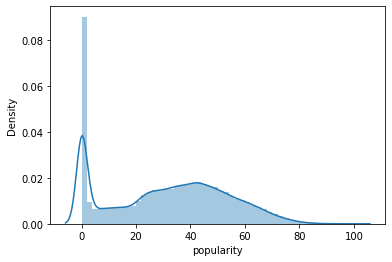

In [ ]:
sns.distplot(spotify_data['popularity'])

### Music Over Time

In [ ]:
def get_decade(year):
    
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    
    return decade

spotify_data['decade'] = spotify_data['year'].apply(get_decade)

/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='decade', ylabel='count'>

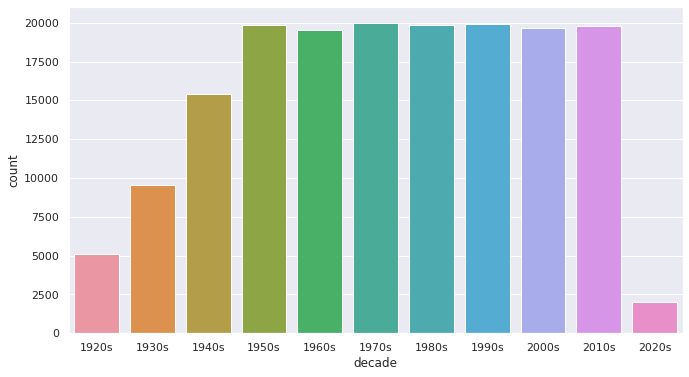

In [ ]:
# visualize quantity of songs produced over time, by decade

sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(spotify_data['decade'])

In [ ]:
# visualize various features of music (at large) over time

import plotly.express as px 

sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(data_by_year, x='year', y=sound_features, title='Music Over Time')

fig.show()

In [ ]:
# visualize music tempo (at large) over time

fig = px.line(data_by_year, x='year', y='tempo', title='Music Tempo Over Time')

fig.show()

### Characteristics of Different Genres

In [ ]:
# extract top 10 genres by popularity (for fun, try changing the second parameter to, say, instrumentalness or danceability!)

top10_genres = genre_data.nlargest(10, 'popularity')

In [ ]:
fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')

fig.show()

## Clustering Genres

In [ ]:
'''Cluster 2900+ genres into 10 clusters (based on similar features) 
using the unsupervised K-means algorithm'''

# import libraries

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])

X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [ ]:
'''Use tSNE (t-Distributed Stochastic Neighbor Embedding), 
an unsupervised dimensionality reduction algorithm, to compress
and project the multi-dimensional data onto a two-dimensional space
'''

# import libraries
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=2))])
genre_embedding = tsne_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

/shared-libs/python3.7/py/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/shared-libs/python3.7/py/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.007s...
[t-SNE] Computed neighbors for 2973 samples in 0.477s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] Computed conditional probabilities in 0.223s
[t-SNE] Iteration 50: error = 81.9075012, gradient norm = 0.0201269 (50 iterations in 6.266s)
[t-SNE] Iteration 100: error = 76.3936081, gradient norm = 0.0101186 (50 iterations in 5.012s)
[

In [ ]:
# visualize the genre clusters
import plotly.express as px

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

## Clustering Songs

In [ ]:
'''Cluster 160k+ songs into 20 clusters (based on similar features) 
using the unsupervised K-means algorithm'''
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=2, n_init=4))], verbose=True)

'''X: an array of numerical data corresponding to each song -- i.e. valence, acousticness, danceability, energy, duration,
instrumentalness, key, liveness, loudness'''
X = spotify_data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
Initialization complete
Iteration 0, inertia 1644786.2773464674
Iteration 1, inertia 1157092.0957974745
Iteration 2, inertia 1102664.5886308579
Iteration 3, inertia 1084200.3930852422
Iteration 4, inertia 1077124.8119433154
Iteration 5, inertia 1072235.8024317296
Iteration 6, inertia 1068079.735145035
Iteration 7, inertia 1065315.0436021578
Iteration 8, inertia 1063736.976378887
Iteration 9, inertia 1062843.0551634675
Iteration 10, inertia 1062284.8566892096
Iteration 11, inertia 1061902.289908113
Iteration 12, inertia 1061649.730124359
Iteration 13, inertia 1061466.7204657053
Iteration 14, inertia 1061308.186508152
Iteration 15, inertia 1061168.6217336096
Iteration 16, inertia 1061076.8821205038
Iteration 17, inertia 1060987.3493416512
Iteration 18, inertia 1060895.383784014
Iteration 19, inertia 1060789.569610862
Iteration 20, inertia 1060647.6675186146
Iteration 21, inertia 1060474.0570400686
Iteration 22, inerti

Pipeline(steps=[('scaler', StandardScaler()),
                ('kmeans', KMeans(n_clusters=20, n_init=4, verbose=2))],
         verbose=True)

In [ ]:
song_cluster_labels = song_cluster_pipeline.predict(X)

spotify_data['cluster_label'] = song_cluster_labels

In [ ]:
'''Use PCA (principal components analysis), another dimensionality reduction technique that runs faster than TSNE,
to compress the multi-dimensional song data onto a two-dimensional space,
preserving only the most important two dimensions'''

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = spotify_data['name']
projection['cluster'] = spotify_data['cluster_label']

In [ ]:
# visualize the song clusters
import plotly.express as px

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=69771c6e-a76e-4b75-8043-409b087b6b70' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>